In [39]:
import os
import pandas as pd
import json
import numpy as np
import pandas as pd
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.ensemble import IsolationForest



plt.rcParams['figure.figsize'] = 20, 10
json_file = os.path.abspath(os.path.join(os.getcwd(), os.pardir))+"\\config\\config.json"
# Leer el archivo JSON
with open(json_file, 'r') as f:
    cfg = json.load(f)

# Carga el conjunto de datos en un DataFrame de pandas
dat1 = pd.read_csv(cfg['root_folder'] + "\\data\\"+cfg['data_model'])
#dat = pd.read_csv(cfg['root_folder'] + "\\data\\data_model.csv")
data1=dat1.copy()
data1 = data1.drop(['id','timestamp'], axis=1)
dat2 = pd.read_csv(cfg['root_folder'] + "\\data\\data_model2.csv")
data2=dat2.copy()
data2 = data2.drop(['id','timestamp'], axis=1)
dat3 = pd.read_csv(cfg['root_folder'] + "\\data\\data_model3.csv")
data3=dat3.copy()
data3 = data3.drop(['id','timestamp'], axis=1)

model_dat = pd.read_csv(cfg['root_folder'] + "\\data\\"+cfg['data_name'])
model_dat_cod1 = pd.read_csv(cfg['root_folder'] + "\\data\\"+cfg['data_result'])
model_dat_cod2 = pd.read_csv(cfg['root_folder'] + "\\data\\model2.csv")
model_dat_cod3 = pd.read_csv(cfg['root_folder'] + "\\data\\model3.csv")



In [44]:
model_dat['timestamp'] = model_dat['timestamp'].str.replace('.', '', regex=False).astype(float)
model_dat = model_dat.merge(model_dat_cod1,on='timestamp',how='left')
model_dat = model_dat.merge(model_dat_cod2[['id','kmeans','isolation_score','isolation_pred']],on='id',how='left',suffixes=['','2'])
model_dat = model_dat.merge(model_dat_cod3[['id','kmeans','isolation_score','isolation_pred']],on='id',how='left',suffixes=['','3'])

In [81]:
def ClusterElbowCurve():
    Clusters = range(1, 10)
    KmeansClustering = [KMeans(n_clusters = Cluster).fit(data3) for Cluster in Clusters]
    KmeansScores = [KmeansClustering[Cluster].score(
        data3) for Cluster in range(len(KmeansClustering))]
    Fig, ax = plt.subplots()
    ax.plot(Clusters, KmeansScores)

def ScatteringKMeansModel():
    Fig, ax = plt.subplots()
    ax.scatter(model_dat['PrincipalFeature1'], model_dat['PrincipalFeature2'], 
                c = model_dat["Cluster"])
    
def ScatteringKMeansModelAnomaly():
    Fig, ax = plt.subplots()
    ax.scatter(model_dat['PrincipalFeature1'], model_dat['PrincipalFeature2'],
                c= model_dat["AnomalyKMeans"])

C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
c:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2103: FutureWarning: The `axis` variable is no longer used and will be removed. Instead, assign variables directly to `x` or `y`.
  warnings.warn(msg, FutureWarning)


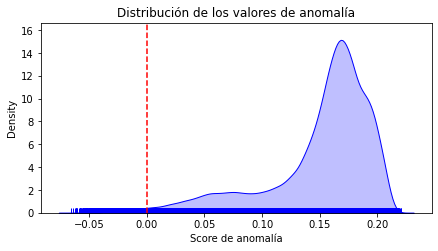

In [34]:
import matplotlib.pyplot as plt
import seaborn as sns
isolation_model = IsolationForest(contamination=0.01)
isolation_model.fit(data1)
isolation_scores = isolation_model.decision_function(data1)
dat1['isolation_score']=isolation_scores
dat1['isolation_pred']=isolation_model.predict(data1)
# ==============================================================================
cuantil_01 = np.quantile(isolation_scores, q=0.01)
cuantil_01
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7, 3.5))
sns.distplot(
    isolation_scores,
    hist    = False,
    rug     = True,
    color   = 'blue',
    kde_kws = {'shade': True, 'linewidth': 1},
    ax      = ax
)
ax.axvline(cuantil_01, c='red', linestyle='--', label='cuantil 0.01')
ax.set_title('Distribución de los valores de anomalía')
ax.set_xlabel('Score de anomalía');

In [61]:
Cluster = 10
OutliersFraction = 0.01
    
Kmeans = KMeans(n_clusters = Cluster).fit(data1)
KmeansDistance = GetDistanceByPoint(data1, Kmeans)
NumberOfOutliers = int(OutliersFraction*len(KmeansDistance))
Threshold = KmeansDistance.nlargest(NumberOfOutliers).min()
dat1['AnomalyKMeans'] = (KmeansDistance >= Threshold).astype(int)
dat1['Cluster'] = Kmeans.predict(data1)


C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Local\Temp/ipykernel_10012/2025321957.py:2: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  ClusterDistance = pd.Series()


In [62]:
pca = PCA(n_components = 2)
DatasetGrouped = pca.fit_transform(data1)
dat1['PrincipalFeature1'] = DatasetGrouped[:,0]
dat1['PrincipalFeature2'] = DatasetGrouped[:,1]
model_dat = model_dat.merge(dat1[['id','AnomalyKMeans','PrincipalFeature1','PrincipalFeature2']],on='id',how='left',suffixes=['','2'])

In [72]:
pd.crosstab(model_dat['kmeans'], model_dat['kmeans2'], normalize='index')
pd.crosstab(model_dat['kmeans'], model_dat['kmeans3'], normalize='index')
pd.crosstab(model_dat['isolation_pred'], model_dat['AnomalyKMeans'], normalize='index')
pd.crosstab(model_dat['isolation_pred2'], model_dat['AnomalyKMeans'], normalize='index')
pd.crosstab(model_dat['isolation_pred3'], model_dat['AnomalyKMeans'], normalize='index')
pd.crosstab(model_dat['kmeans'], model_dat['AnomalyKMeans'], normalize='index')
pd.crosstab(model_dat['isolation_pred'], model_dat['isolation_pred2'], normalize='index')
pd.crosstab(model_dat['isolation_pred2'], model_dat['isolation_pred3'], normalize='index')
pd.crosstab(model_dat['isolation_pred'], model_dat['isolation_pred3'], normalize='index')
model_dat = model_dat.drop(['kmeans2','kmeans3'],axis=1)

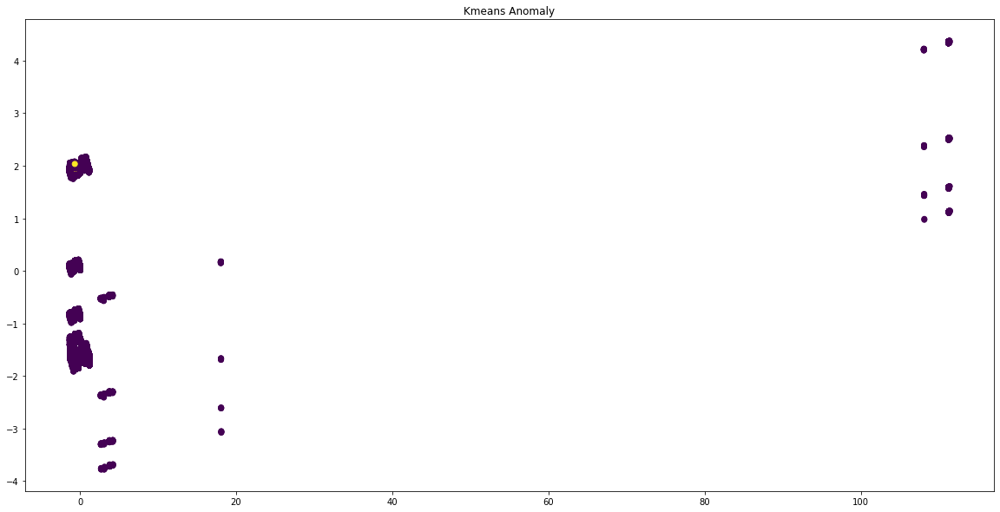

In [83]:
#data1
ScatteringKMeansModelAnomaly()
plt.title('Kmeans Anomaly')
plt.show()

C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

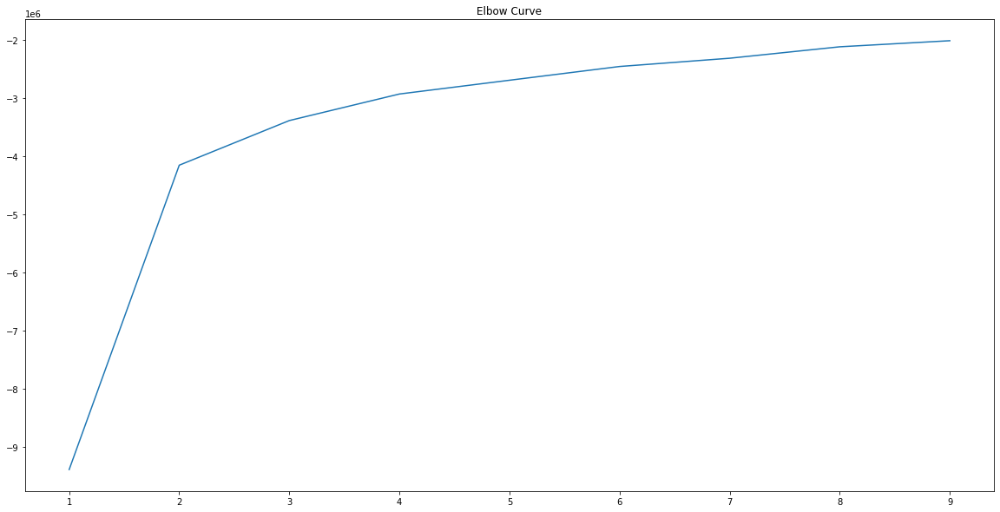

In [53]:
##data1
ClusterElbowCurve()
plt.title('Elbow Curve')
plt.show()

C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

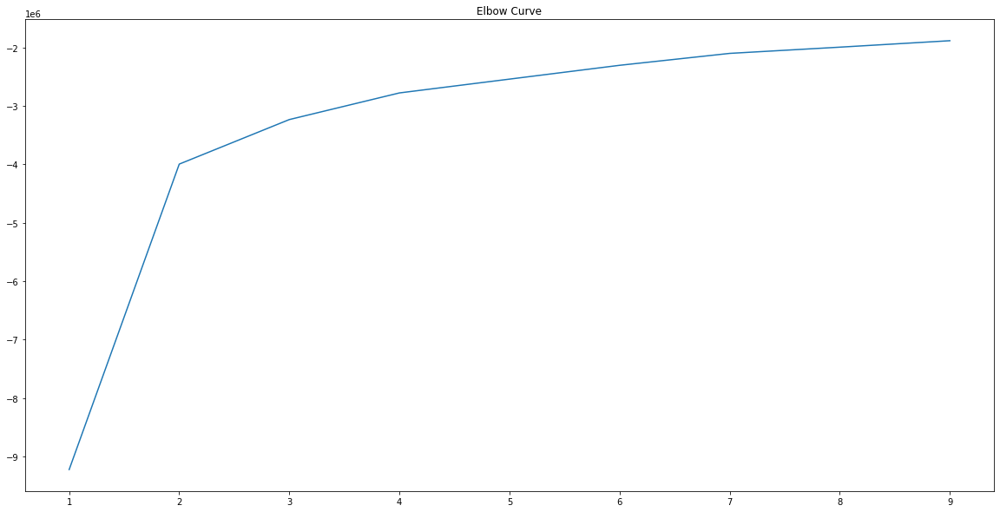

In [108]:
##data2
ClusterElbowCurve()
plt.title('Elbow Curve')
plt.show()

C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\marcorhe\AppData\Roaming\Python\Python39\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress t

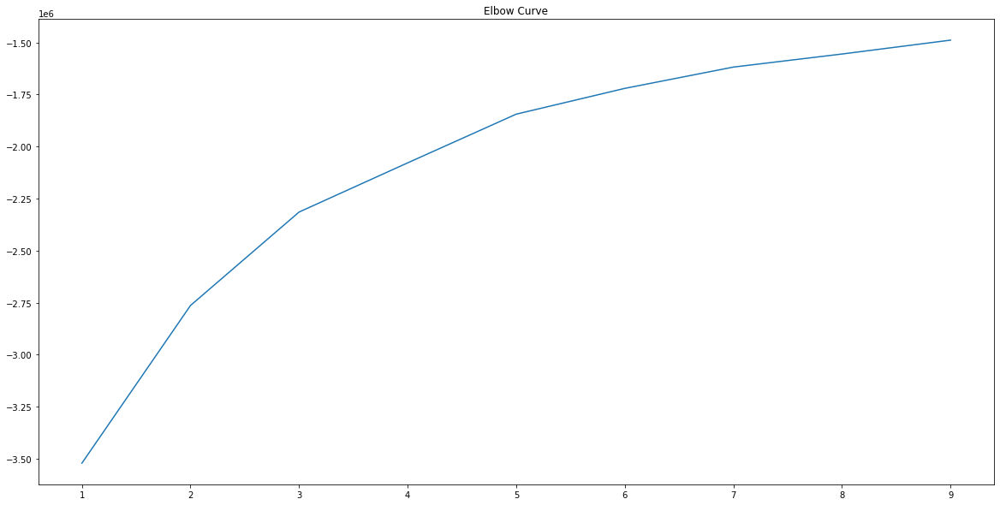

In [111]:
##data1
ClusterElbowCurve()
plt.title('Elbow Curve')
plt.show()

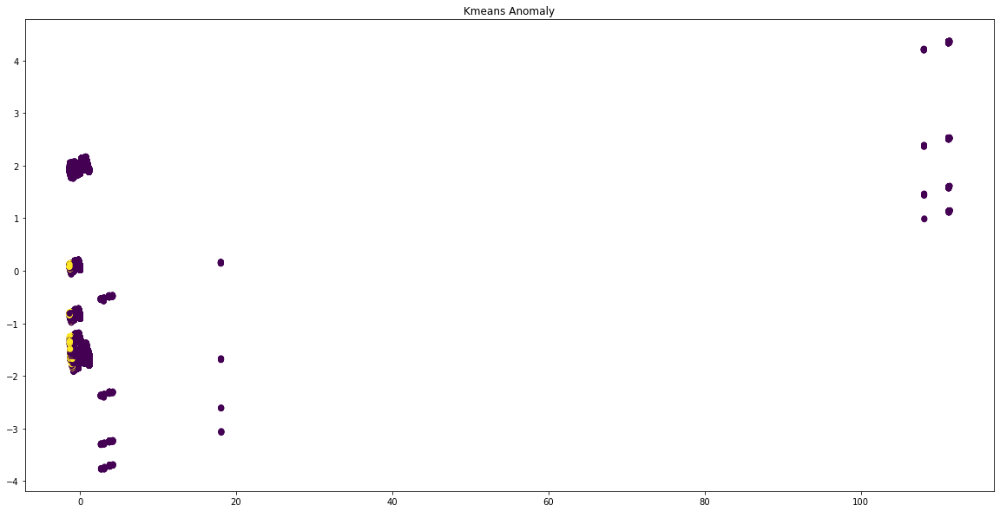

In [84]:
#data1
ScatteringKMeansModelAnomaly()
plt.title('Kmeans Anomaly')
plt.show()

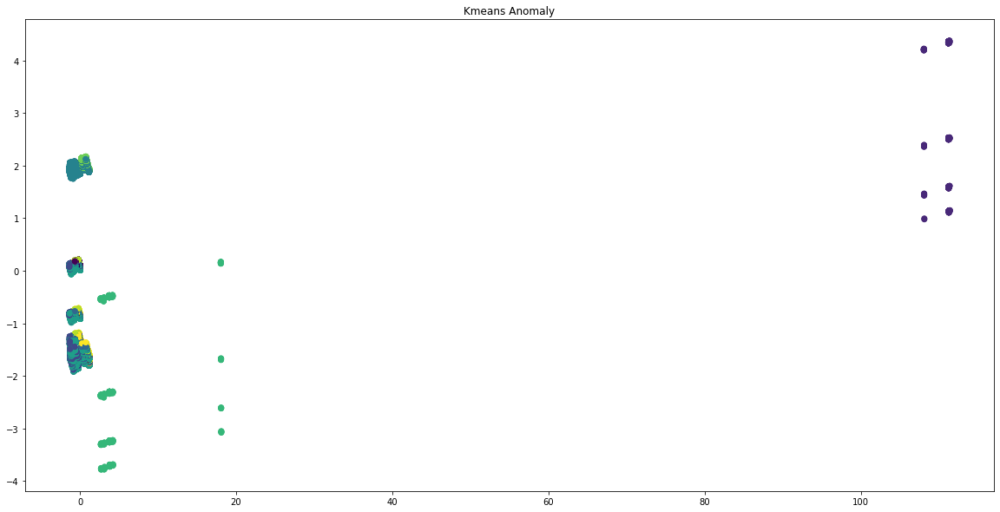

In [86]:
#data1
ScatteringKMeansModel()
plt.title('Kmeans Anomaly')
plt.show()

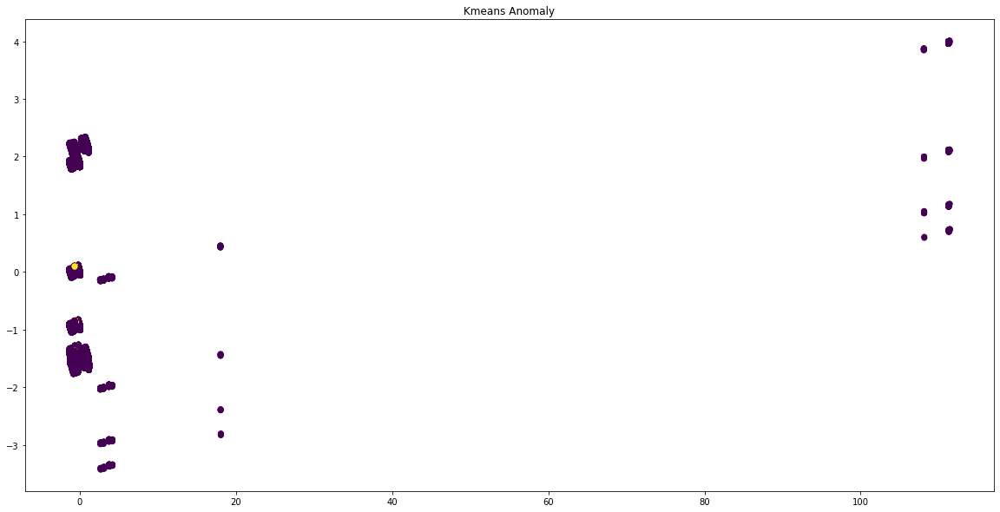

In [105]:
#data2
ScatteringKMeansModelAnomaly()
plt.title('Kmeans Anomaly')
plt.show()

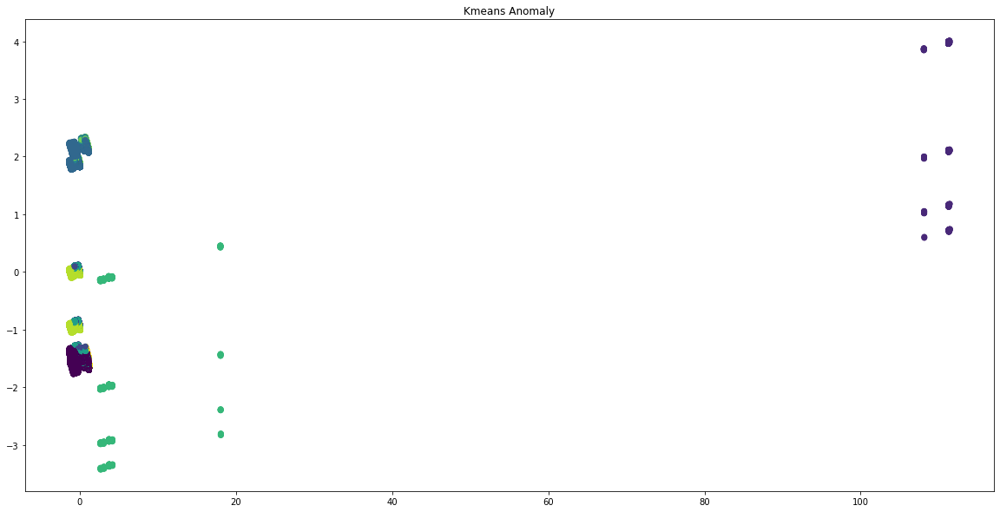

In [106]:
#data2
ScatteringKMeansModel()
plt.title('Kmeans Anomaly')
plt.show()

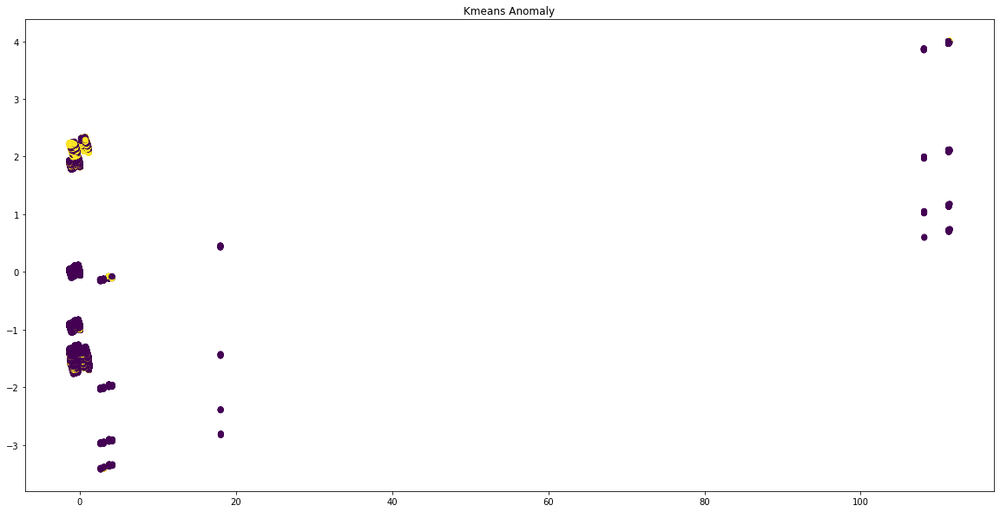

In [113]:
#data3
ScatteringKMeansModelAnomaly()
plt.title('Kmeans Anomaly')
plt.show()

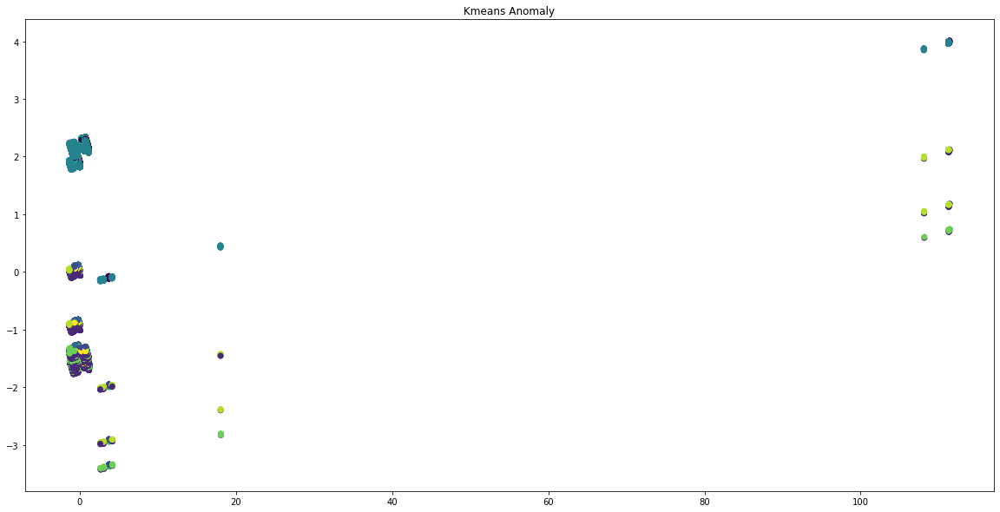

In [114]:
#data3
ScatteringKMeansModel()
plt.title('Kmeans Anomaly')
plt.show()

In [73]:
from pandas.plotting import table
import matplotlib.pyplot as plt
import seaborn as sns
def interpretacion(datos,numeric,categoric,var_nom):   
     
#porcentaje en cada cluster
    ax = sns.countplot(y=var_nom, data=datos)
    plt.title('Porcentaje Cluster')
    plt.xlabel('%')
    total = len(datos[var_nom])
    for p in ax.patches:
            percentage = '{:.2f}%'.format(100 * p.get_width()/total)
            x = p.get_x() + p.get_width() + 0.02
            y = p.get_y() + p.get_height()/2
            ax.annotate(percentage, (x, y))

#boxplots

            # Gráficamos un boxplot por cada clúster
    for col in numeric:
        fig, axs = plt.subplots(1,2, figsize = (25,9.6)) 

    # Agregamos titulo a la figura.
        fig.suptitle(col.upper().replace("_", " "), fontsize = 20)
        grouped_data = datos[[col,var_nom]].groupby(var_nom)
        # Estadísticas para todas las columnas numéricas por cluster
        tab = np.round(grouped_data.describe(),2)
        
        the_table = table(axs[1], tab, loc='center',cellLoc = 'center')
        the_table.set_fontsize(14)
        the_table.scale(1.3, 2)
        axs[1].axis("off")  
        
        plt.axes(axs[0])
        ax = sns.boxplot(y = col, x = var_nom, data = datos, orient = "v", width = 0.45, palette = "Set1")
        
                    # Pesonalizamos la gráfica
        ax.set_ylabel(col.replace("_", " "), fontsize = 15)
        ax.set_xlabel("Número clúster", fontsize = 15)
        

   # Gráfico de barras de sobreviviviente segun clase
    for col in categoric:
        fig, axs = plt.subplots(2,1, figsize = (25,9.6)) 

    # Agregamos titulo a la figura.
        fig.suptitle(col.upper().replace("_", " "), fontsize = 20)
        tab = np.round(pd.crosstab(index=datos[col],
            columns=datos[var_nom]).apply(lambda r: r/r.sum() *100,axis=0),2)
        the_table = table(axs[0], tab, loc='center',cellLoc = 'center')
        axs[0].axis("off")         
        plt.axes(axs[1])
        tab.plot(kind='bar')                     

       
def principales_vars(datos_norm,var_nom):
    perfilado = datos_norm.groupby(var_nom).mean() 
    perfilado.reset_index( drop = False, inplace = True )
    perfilado['__fac_x__'] = perfilado[var_nom].map(lambda x: f'{var_nom}{x+1}') 
    nmes = perfilado[var_nom].map(lambda x: f'Cluster {var_nom}')                                                                             
    perfilado.drop(var_nom, axis = 1, inplace = True )    

    fac_y = list(perfilado.drop( ['__fac_x__'], axis = 1 ).columns)
    fac_x = list(perfilado['__fac_x__'])
    nmes = list(nmes)      

    list_of_lists = [ [name] * len(perfilado['__fac_x__'].unique()) for name in fac_y ]
    y = [ itm for list_ in list_of_lists for itm in list_ ]
    x = fac_x * len(fac_y)
    
    tup_key = list( zip(y, x) )
    medias_clus = [ perfilado.loc[ perfilado["__fac_x__"] == tup[1], tup[0] ].values[0]  for tup in tup_key ]                  
    data = dict(x = x, y = y, medias_clus = medias_clus)
    
    main_vars = pd.DataFrame(data)

    main_vars = main_vars.sort_values(['x', 'medias_clus'], ascending = [1,0]).groupby('x').apply(lambda x: x)
    
    top_vars = main_vars.groupby('x').head(5).reset_index(drop = True)
    bottom_vars = main_vars.groupby('x').tail(5).reset_index(drop = True)
    main_vars = pd.concat([top_vars, bottom_vars])
    main_vars = main_vars.sort_values('x')

    return main_vars

def tipo_variables(datos,ncat):
    ids=[]
    omitir=[]
    for i in datos.columns:
        #ids sugeridos
        if(datos[i].nunique() == datos.shape[0]): ids.append(i)
        # Nulos
        if(all(datos[i].isnull())): omitir.append(i)
        # Si los datos que hay en la columna son siempre el mismo, se da una advertencia
        if(datos[i].nunique() == 1): omitir.append(i)        

    data = datos.drop(ids, axis=1)
    data = datos.drop(omitir, axis=1)

    ##
    # Identificar tipo variables
    ##

    tipos={}
    for i in range(0,len(data.dtypes.value_counts())):
        tipo_dato = data.dtypes.value_counts().index[i].kind
        tipoj=[]
        for j in range(0,data.shape[1]):
            if(data.dtypes[j].kind==tipo_dato):
                tipoj.append(data.dtypes.index[j])
        tipos[tipo_dato]=tipoj
    '''
    if not np.issubdtype(df_analysis[col].dtype, np.number):
                print(f'La variable {cb}{col}{cc} NO es numerica')
                continue
    '''
    numeric = tipos.get('i',[]) + tipos.get('f',[]) + tipos.get('u',[])
    c = data[numeric].nunique()
    categoric2 = c[c<=ncat].axes[0].tolist()    
    for i in categoric2: numeric.remove(i)
    categoric =  categoric2 + tipos.get('b',[])+tipos.get('c',[])+tipos.get('m',[])+tipos.get('M',[])+tipos.get('O',[])+tipos.get('S',[])+tipos.get('U',[])+tipos.get('V',[])
    datos[categoric2] = datos[categoric2].astype('str')

    return numeric, categoric

In [127]:
num,cat = tipo_variables(model_dat,10)

In [104]:
conditions = [(model_dat['kmeans'] == 1) & (model_dat['isolation_pred'] == -1) & (model_dat['isolation_pred2'] == -1) & (model_dat['isolation_pred3'] == -1),
              (model_dat['kmeans'] == 1),
              (model_dat['isolation_pred3'] == -1) & (model_dat['isolation_pred2'] == -1) & (model_dat['isolation_pred'] == -1) & (model_dat['AnomalyKMeans'] == 1),
              (model_dat['isolation_pred3'] == -1) & (model_dat['isolation_pred2'] == -1) & (model_dat['isolation_pred'] == -1),
              (model_dat['isolation_pred3'] == -1) & (model_dat['isolation_pred2'] == -1),
              (model_dat['isolation_pred3'] == -1),
              (model_dat['isolation_pred2'] == -1) & (model_dat['isolation_pred'] == -1) & (model_dat['AnomalyKMeans'] == 1),
              (model_dat['isolation_pred2'] == -1) & (model_dat['isolation_pred'] == -1),
              (model_dat['isolation_pred2'] == -1),
              (model_dat['isolation_pred'] == -1) & (model_dat['AnomalyKMeans'] == 1),
              (model_dat['isolation_pred'] == -1),
              (model_dat['AnomalyKMeans'] == 1),
              True]

results = [1, 2, 3,4,5,6,7,8,9,10,11,12,-1]

# Crear la nueva columna utilizando numpy.select()
model_dat['Anomaly_Final'] = np.select(conditions, results, default=-1)
model_dat['Anomaly_Final'].value_counts()

In [106]:
model_dat.to_csv(cfg['root_folder'] + "/data/"+'result.csv', index=False)

C:\Users\marcorhe\AppData\Local\Temp/ipykernel_10012/1377408523.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1,2, figsize = (25,9.6))


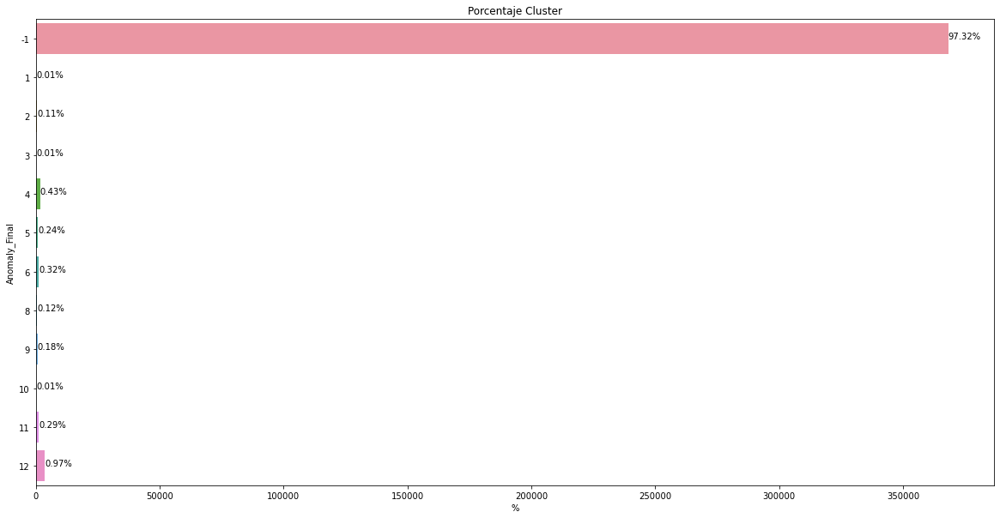

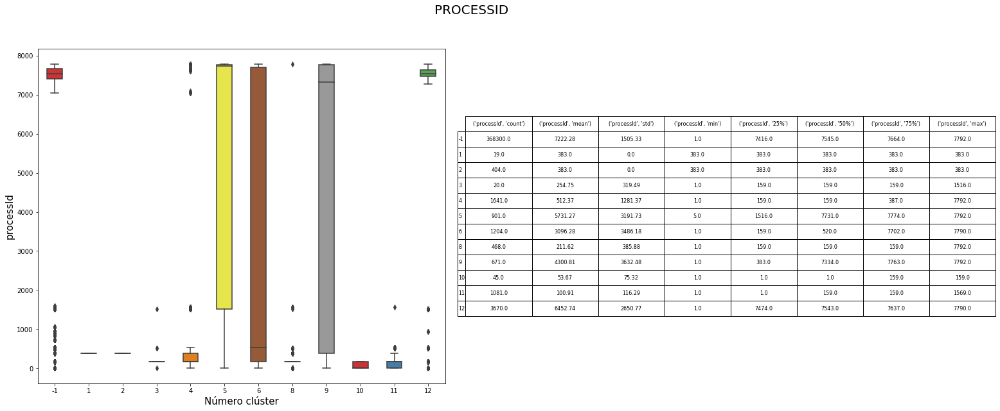

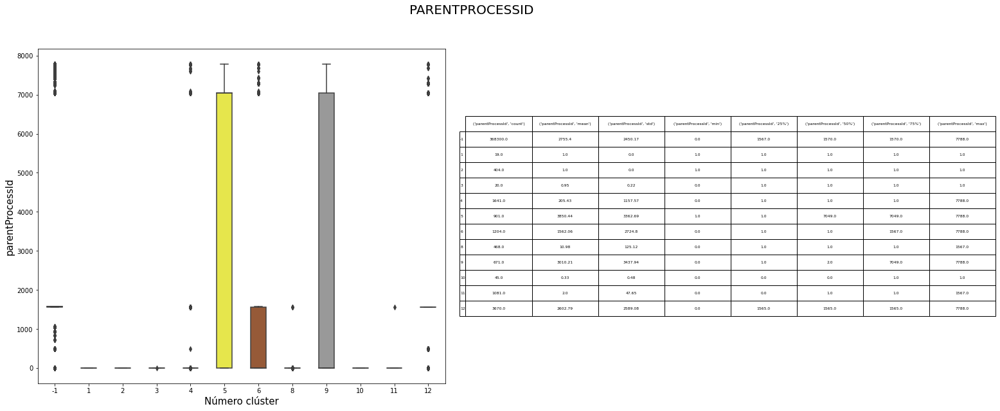

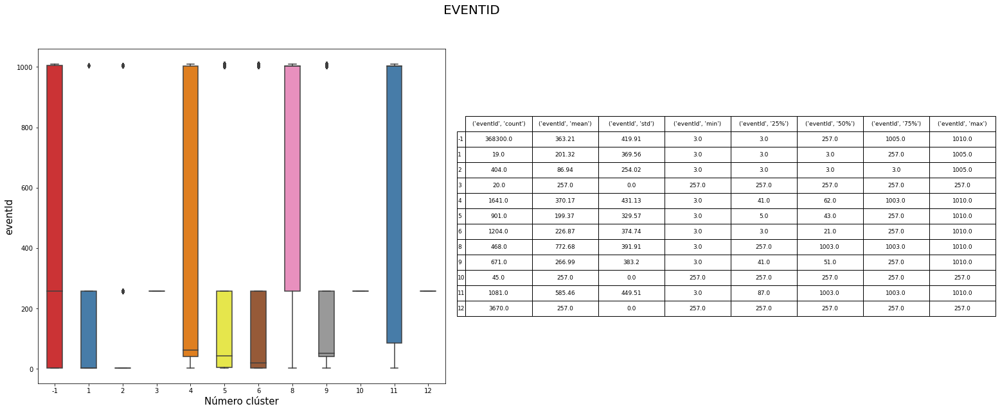

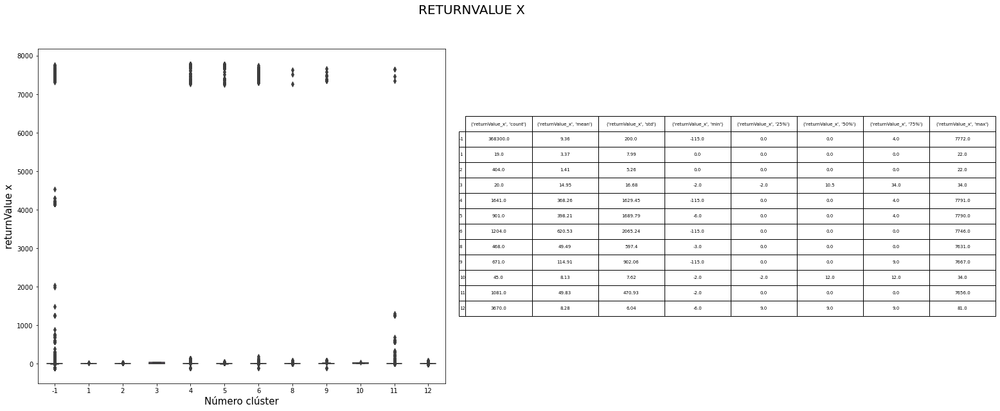

...

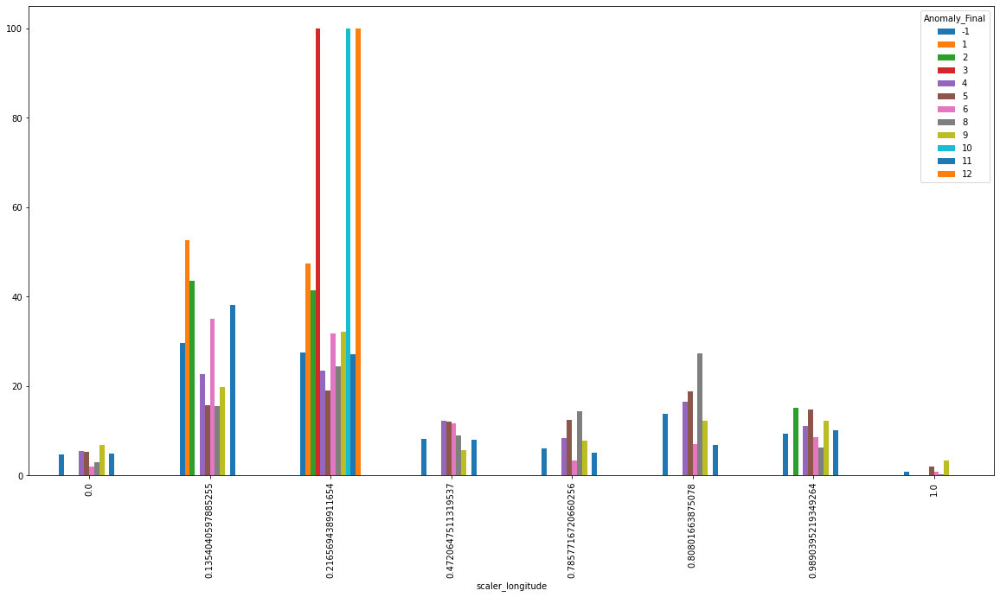

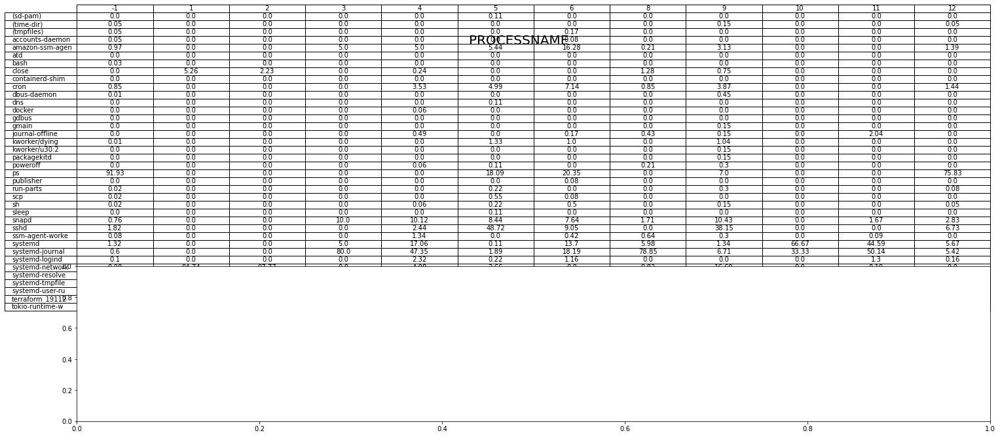

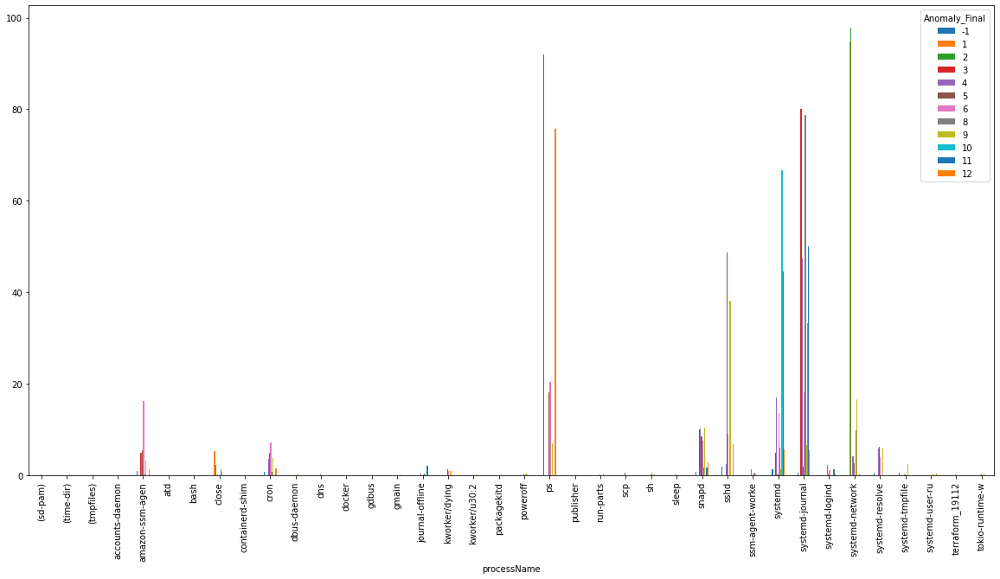

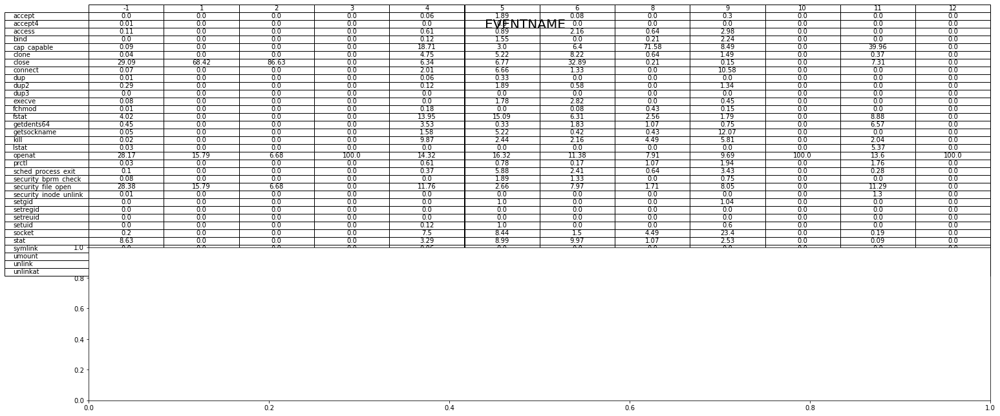

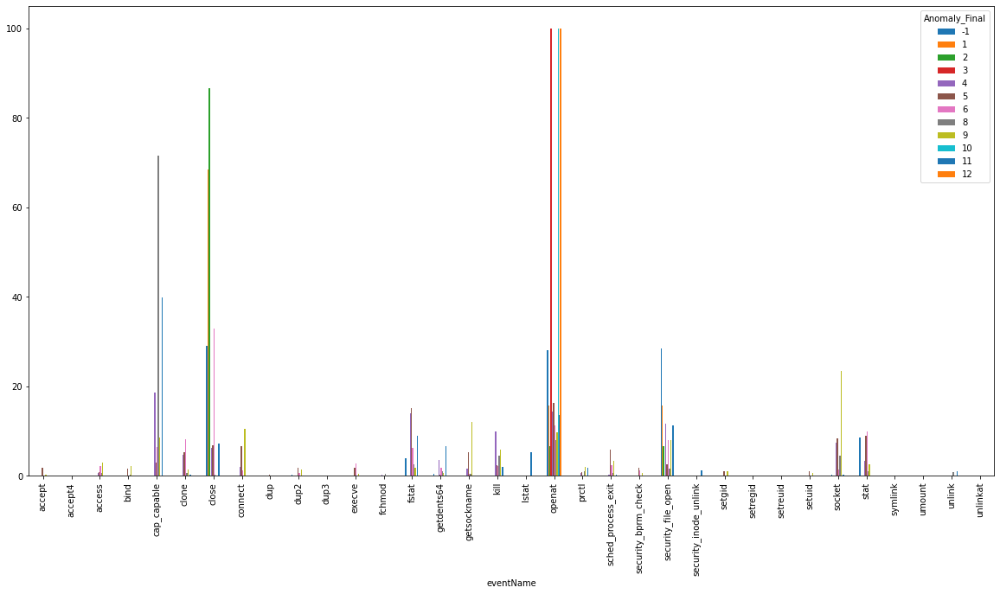

c:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 65407 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 65405 missing from current font.
  font.set_text(s, 0.0, flags=flags)


In [142]:
interpretacion(model_dat,num,cat,'Anomaly_Final')

C:\Users\marcorhe\AppData\Local\Temp/ipykernel_10012/1377408523.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1,2, figsize = (25,9.6))


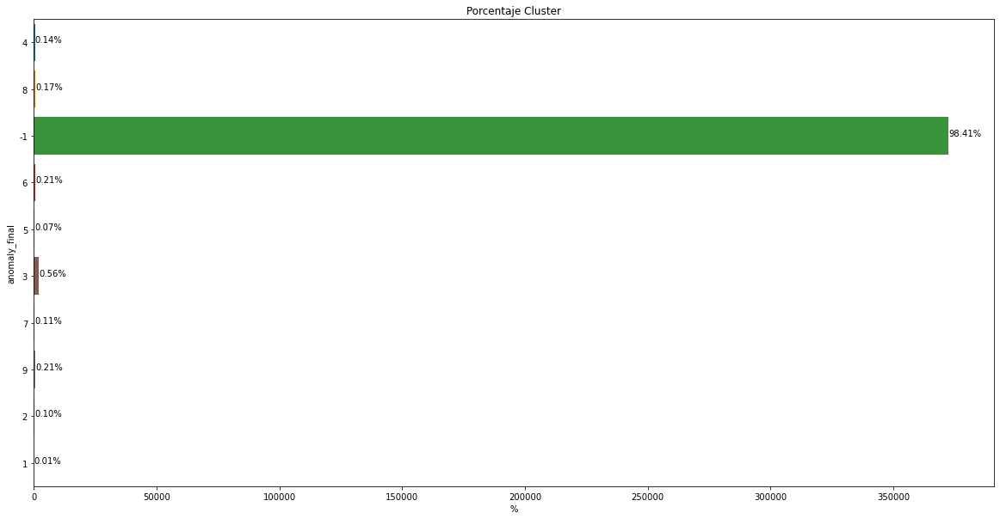

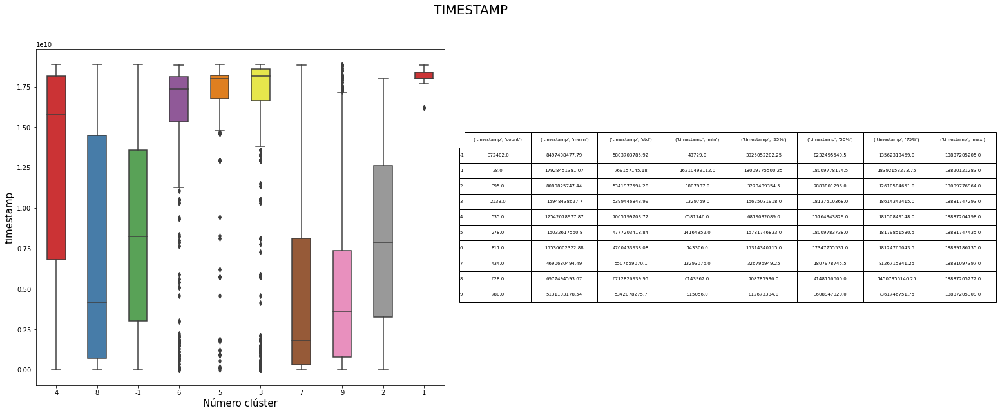

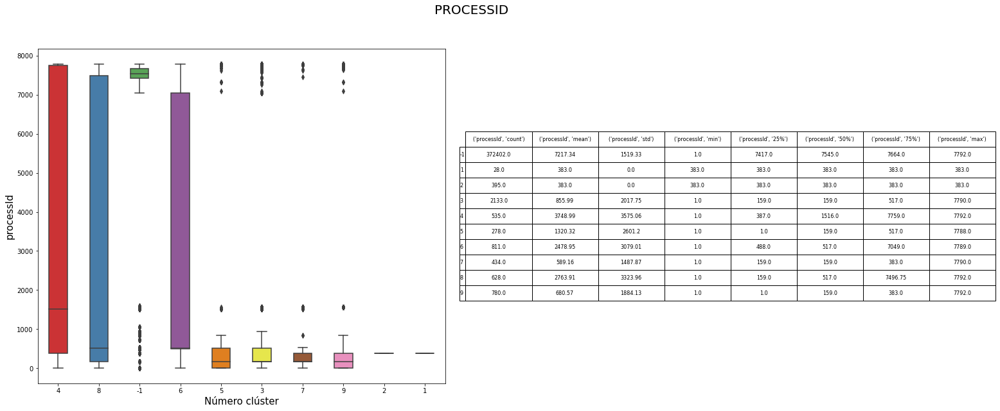

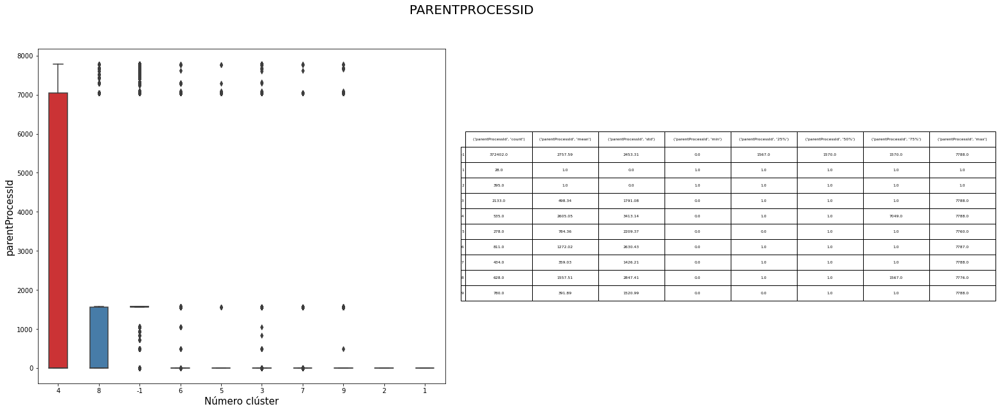

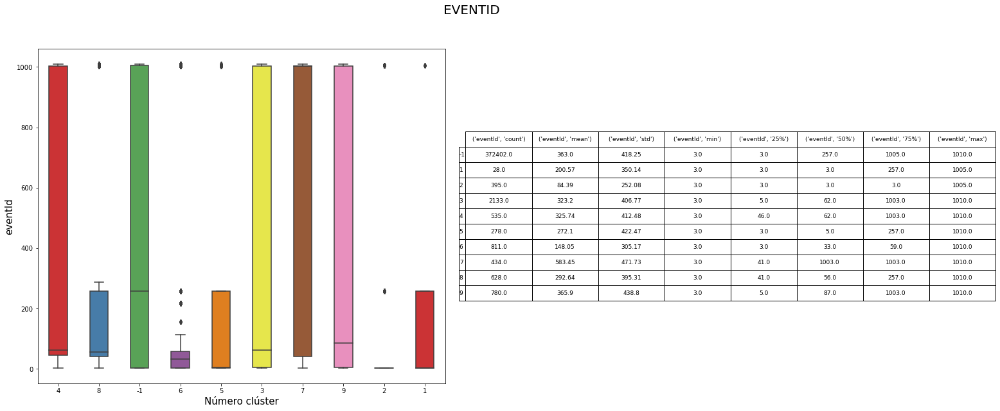

...

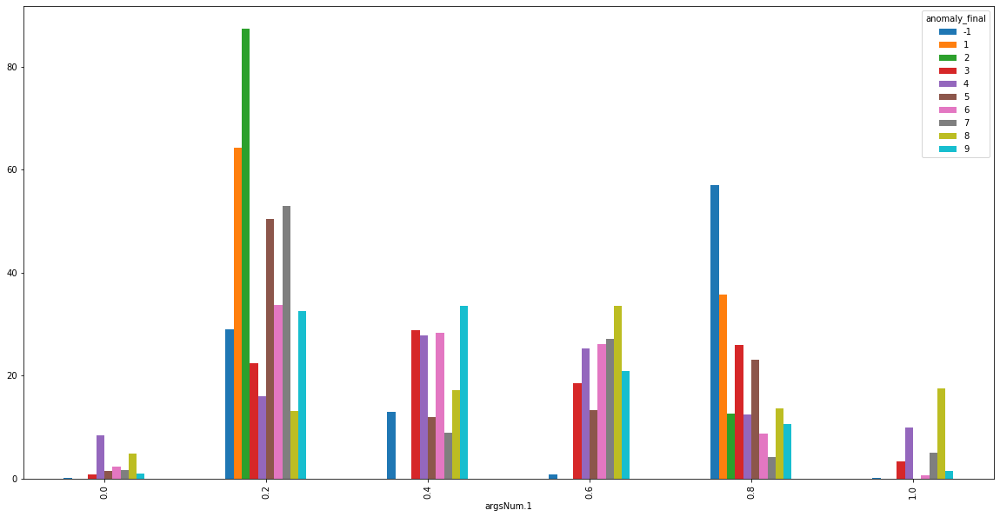

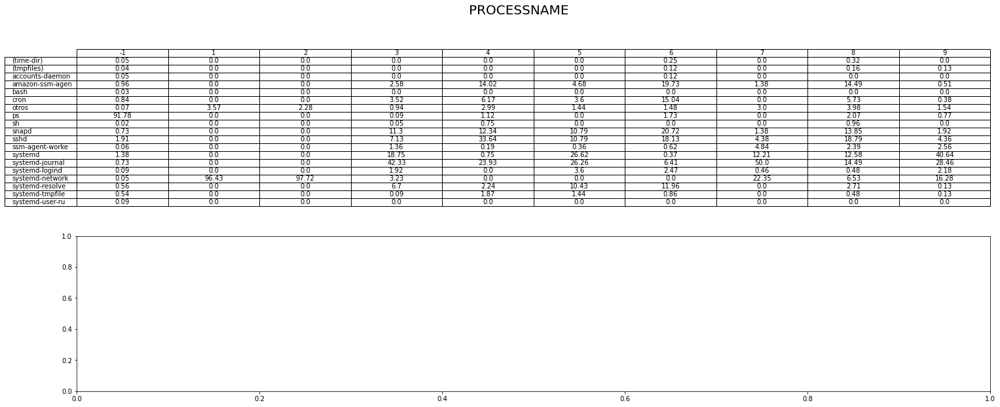

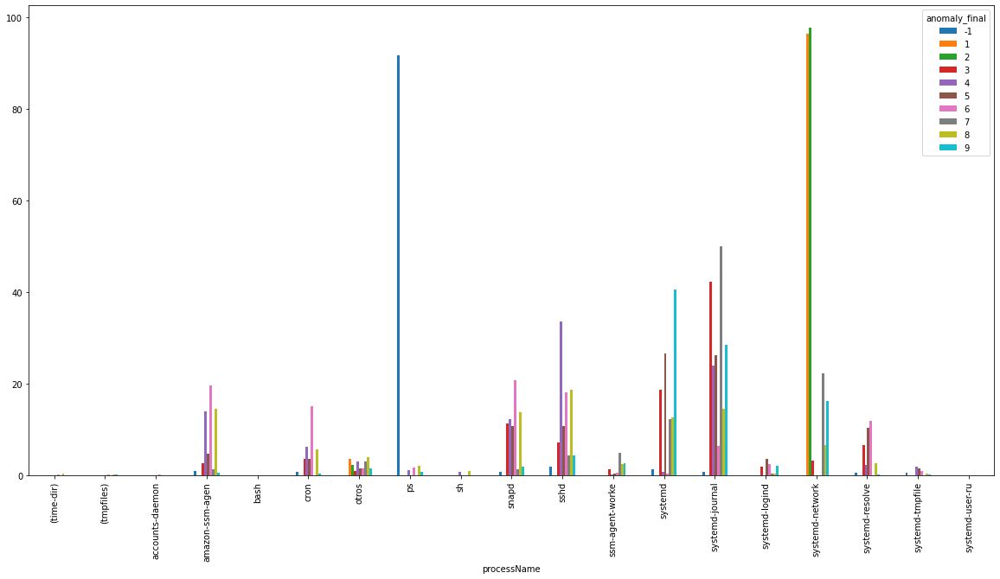

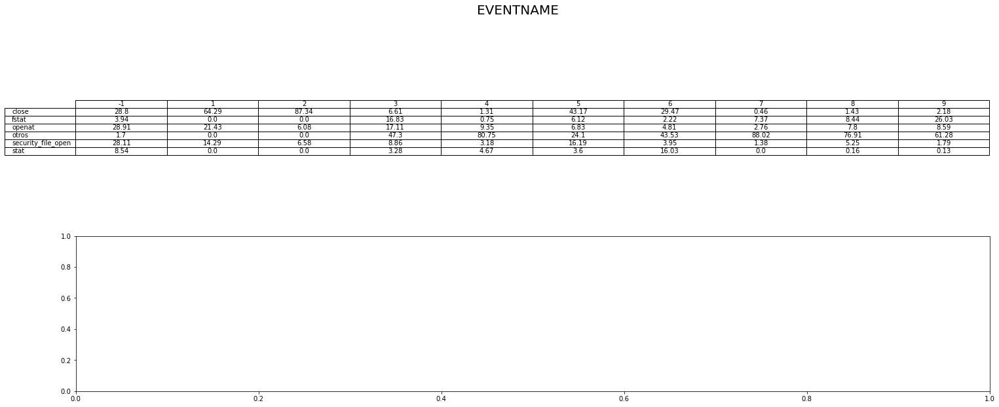

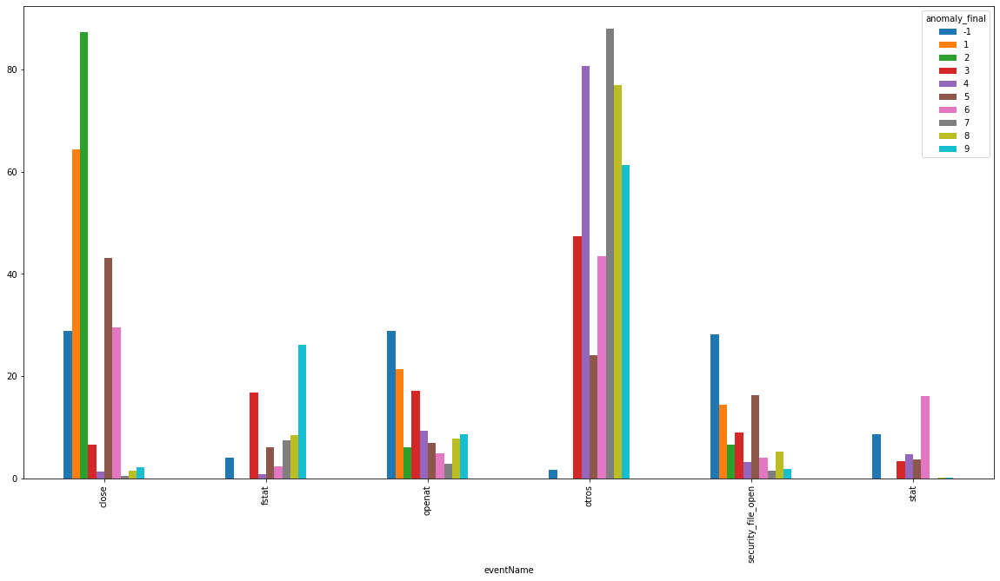

c:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 65407 missing from current font.
  font.set_text(s, 0.0, flags=flags)
c:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:240: RuntimeWarning: Glyph 65405 missing from current font.
  font.set_text(s, 0.0, flags=flags)


Error in callback <function flush_figures at 0x00000198F8EE7700> (for post_execute):


KeyboardInterrupt: 

In [23]:
interpretacion(model_dat,num,cat,'anomaly_final')

In [125]:
a=principales_vars(model_dat.drop(['AnomalyKMeans','isolation_pred','isolation_pred2','isolation_pred3','isolation_score','id','PrincipalFeature1','PrincipalFeature2','isolation_score2','isolation_score3','kmeans',],axis=1),'Anomaly_Final')

In [126]:
a[60:70]

,x,y,medias_clus
34,Anomaly_Final3,userId.1,1.000000e+02
31,Anomaly_Final3,processName_systemd-user-ru,0.000000e+00
33,Anomaly_Final3,userId,1.000000e+02
32,Anomaly_Final3,eventxuser,1.106071e+02
31,Anomaly_Final3,processId,3.830000e+02
30,Anomaly_Final3,timestamp,8.291769e+09
33,Anomaly_Final3,device_iPhone,0.000000e+00
32,Anomaly_Final3,device_Macintosh,0.000000e+00
34,Anomaly_Final3,continent_code_EU,0.000000e+00
30,Anomaly_Final3,processName_systemd-tmpfile,0.000000e+00
